# NPZDA_isotope model

### Adapted from Sarmiento and Gruber (2006) and Yoshikawa et al. (2005)
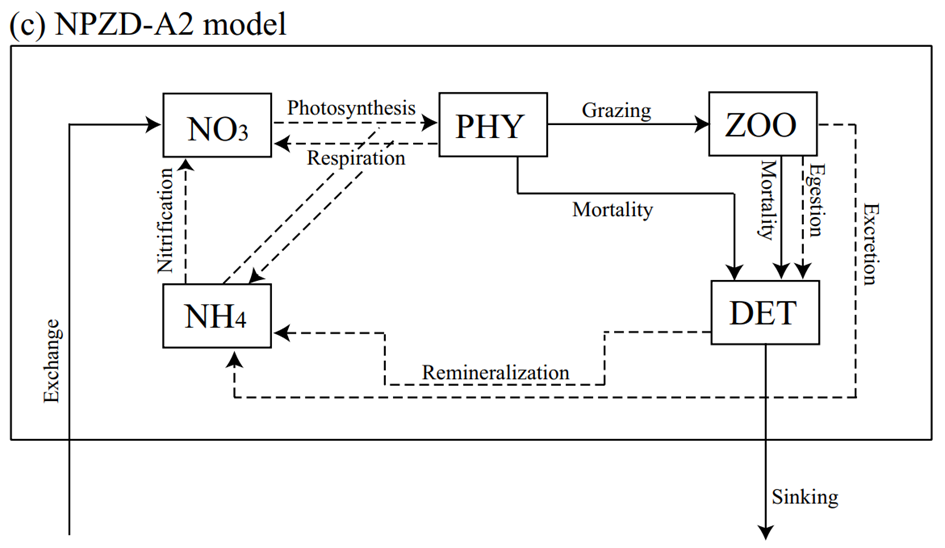

In [1]:
### Import modules
import numpy as np
import pandas as pd
#from scipy import *
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.gridspec import GridSpec
from scipy.integrate import solve_ivp
# For sliders
from ipywidgets import interact, FloatSlider, interactive, HBox, VBox, Layout
# For converting Python language to machine language to boost model run time
from numba import jit
# Turn off numba warning
import warnings
warnings.filterwarnings('ignore')

In [2]:
### Coefficients
h = 1 # times
nuto = .001 # initial condition for nutrient
phyo = .001 # initial condition for phyto
zooo = .001 # initial condition for zoo
deto = .001 # initial condition for detritus
# set parameters
Vmax = 1.0 # per day
K = 2 # mmol/m3
Kp= 2.8 # mmol/m3, half-saturation constant for phytoplankton grazing
Kammo=0.2 #mmol/m3
a = 0.66
b= 0.33
g = 1.4 # per day, maximum specific zooplankton grazing rate
phy0 = 0.05 # grazing threshold
lp = 0.05# per day
lz = 0.05 # per day
ld = 0.05 # per day
Wsink=20 # m/day, detritus sinking velocity
c = .01 # 1/day, background mixing rate
#
h0 = 50 # m
h1 = 100 # m
#
I0 = 40 # W/m2
I1 = 150 # W/m2
#
zI = 20 #m
KI = 60 # W/m2
#
fPAR = .4
#
psi = 1 # ammonium inhibition
# Nutrient injection
Nth = 10
# Absolute value for 15N, 14N in deep water
Nth15 = 1.005 # d15NO3 = 5
Nth14 = 1

# Nitrification rate
nit = 0.15 

# Epsiolon for biological processes
eps_uptakeN= -7.5 # Phytoplankton NO3 uptake
eps_uptakeA= -10 # Phytoplankton NH4 uptake
eps_egestion= -1 # Zooplankton egestion
eps_excretion= -4 # Zooplankton excretion
eps_reminer= -1 # Remineralization
eps_nitri= -14 # Nitrification


In [3]:
### Helper functions
# define model_run function
@jit
def model_run(trange,xinit,param,dt,tendency):
    Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri = param
    sol = solve_ivp(tendency,trange,xinit,args=(Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri),method='RK45',max_step=dt)
    return sol

# Calulate alpha from epsilon
@jit
def alpha(eps):
    alpha = np.exp(eps/1000)
    return alpha

In [4]:
# Evaluate seasonal cycle
%matplotlib inline
def seasonal_cycle(zI,h0,h1,I0,I1):
    t = np.arange(0,365*5,1)
    hml = h0+h1*(1+np.cos(2*np.pi/360*(t)))
    dhdt= -h1*(2*np.pi/360)*np.sin(2*np.pi/360*(t))
    ent0=dhdt/hml
    ent=np.where(ent0>0,ent0,0) + c
    I=fPAR*(I0+I1*(1-np.cos(2*np.pi/360*t)))
    Iave=I*zI/hml
    #
    time = pd.to_datetime(t, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    fig,ax=plt.subplots(2,2,figsize=(8, 8),sharex=True)
    ax[0,0].plot(time,-hml)
    ax[0,0].title.set_text('MLD')
    ax[0,1].plot(time,ent)
    ax[0,1].title.set_text('Entrainment')
    ax[1,0].plot(time,I)
    ax[1,0].title.set_text('I, surface')
    ax[1,1].plot(time,Iave)
    ax[1,1].title.set_text('I, average')
    xlim1 = pd.to_datetime(0, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    xlim2 = pd.to_datetime(365, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    plt.xlim(xlim1,xlim2)
    ax[1,1].xaxis.set_major_locator(mdates.MonthLocator())
    ax[1,1].xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    fig.tight_layout()

interact(seasonal_cycle,
         zI = FloatSlider(min=0, max=100, step =10, value=20),
         h0 = FloatSlider(min=0, max=1000, step =10, value=50),
         h1 = FloatSlider(min=0, max=1000, step =10, value=100),
         I0 = FloatSlider(min=0, max=300, step =10, value=40),
         I1 = FloatSlider(min=0, max=300, step =10, value=150),
        );
         

interactive(children=(FloatSlider(value=20.0, description='zI', step=10.0), FloatSlider(value=50.0, descriptio…

In [5]:
### NPZD-A2, model NO3 and NH4 separately
@jit
def NPZD_A2(t,x,Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri):
    # Import initial conditions
    nitro, ammo, phy, zoo, det, N15, A15, P15, Z15, D15, N14, A14, P14, Z14, D14, export = x
    # Simulated parameters
    hml = h0+h1*(1+np.cos(2*np.pi/360*(t)))
    dhdt= -h1*(2*np.pi/360)*np.sin(2*np.pi/360*(t))
    ent0=dhdt/hml
    ent=np.where(ent0>0,ent0,0) + c
    I=fPAR*(I0+I1*(1-np.cos(2*np.pi/360*t)))
    Iave=I*zI/hml
    F=(nitro/(nitro+K))*np.exp(-psi*ammo)/(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))
    # NPZDA calculation
    dnitrodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*F -ent*(nitro-Nth) + nit*ammo 
    dammodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*(1-F) + ld*det + (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0)) - nit*ammo #-ent*(ammo-ammoth) 
    dphydt = Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI) - zoo*g*((phy-phy0)/(Kp+phy-phy0)) - lp*phy #- ent*phy
    dzoodt = zoo*g*((phy-phy0)/(Kp+phy-phy0)) - lz*zoo - (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0)) - (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0)) #- ent*zoo
    ddetdt = (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0)) + lz*zoo + lp*phy - ld*det -Wsink/hml*det #- ent*det
    # 15N calculation
    d15nitrodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*F*N15*alpha(eps_uptakeN) - ent*(nitro*N15-Nth*Nth15) + nit*ammo*A15*alpha(eps_nitri)
    d15ammodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*(1-F)*A15*alpha(eps_uptakeA) + ld*det*D15*alpha(eps_reminer) + (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z15*alpha(eps_excretion) - nit*ammo*A15*alpha(eps_nitri) #- ent*(ammo*A15-ammoth*ammoth15)
    d15phydt = Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*F*N15*alpha(eps_uptakeN) + Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*(1-F)*A15*alpha(eps_uptakeA) - zoo*g*((phy-phy0)/(Kp+phy-phy0))*P15 - lp*phy*P15 #- ent*phy*P15
    d15zoodt = zoo*g*((phy-phy0)/(Kp+phy-phy0))*P15 - lz*zoo*Z15 - (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z15*alpha(eps_excretion) - (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z15*alpha(eps_egestion) #-ent*zoo*Z15
    d15detdt = (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z15*alpha(eps_egestion) + lz*zoo*Z15 + lp*phy*P15 - ld*det*D15*alpha(eps_reminer) -Wsink/hml*det*D15 #-ent*det*D15
    # 14N calculation
    d14nitrodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*F*N14 - ent*(nitro*N14-Nth*Nth14) + nit*ammo*A14
    d14ammodt = -Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*(1-F)*A14 + ld*det*D14*alpha(eps_reminer) + (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z14  - nit*ammo*A14 #- ent*(ammo*A14-ammoth*ammoth14) 
    d14phydt = Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*F*N14 + Vmax*(nitro/(nitro+K)*np.exp(-psi*ammo)+ammo/(ammo+Kammo))*phy*Iave/(Iave+KI)*(1-F)*A14 - zoo*g*((phy-phy0)/(Kp+phy-phy0))*P14 - lp*phy*P14 #- ent*phy*P14
    d14zoodt = zoo*g*((phy-phy0)/(Kp+phy-phy0))*P14 - lz*zoo*Z14 - (a-b)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z14 - (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z14 #- ent*zoo*Z14
    d14detdt = (1-a)*zoo*g*((phy-phy0)/(Kp+phy-phy0))*Z14 + lz*zoo*Z14 + lp*phy*P14 - ld*det*D14 -Wsink/hml*det*D14 #-ent*det*D14
    dexportdt = Wsink/hml*det + ent*nitro  - ent*Nth #+ ent*ammo - ent*ammoth 
    # Export
    out=np.array([dnitrodt,dammodt,dphydt,dzoodt,ddetdt,d15nitrodt,d15ammodt,d15phydt,d15zoodt,d15detdt,d14nitrodt,d14ammodt,d14phydt,d14zoodt,d14detdt,dexportdt])
    return out


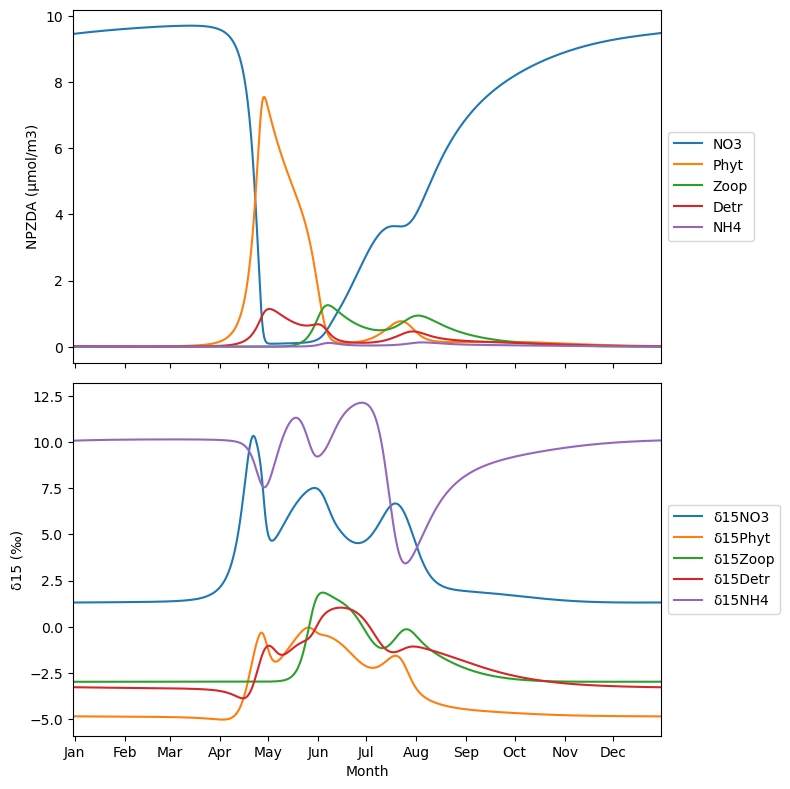

In [6]:
### Model single-run
# set time range
trange = [0,365*5+1]
# set parameters
param=np.array([Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri])
# set initial conditions
xinit = np.array([nuto,.001,phyo,zooo,deto,1,1,1,1,1,1,1,1,1,1,0])
# time step size
h = 1
# Run model
a2out = model_run(trange,xinit,param,h,NPZD_A2)
# Calculat d15N
delta15 = ((a2out.y[5:10,:]/(a2out.y[5:10,:]+a2out.y[10:15,:]/0.00366))/0.00366-1)*1000

### Plot
# plot the N15put
t_a2out = pd.to_datetime(a2out.t, unit = 'D',origin=pd.Timestamp("01-01-2020"))
N_a2out = a2out.y[0,:]
A_a2out = a2out.y[1,:]
P_a2out = a2out.y[2,:]
Z_a2out = a2out.y[3,:]
D_a2out = a2out.y[4,:]
#
fig, [ax1,ax2]=plt.subplots(2,figsize=(8, 8),sharex=True)
# Plot NPZDA
ax1.plot(t_a2out,N_a2out,label='NO3')
ax1.plot(t_a2out,P_a2out,label='Phyt')
ax1.plot(t_a2out,Z_a2out,label='Zoop')
ax1.plot(t_a2out,D_a2out,label='Detr')
ax1.plot(t_a2out,A_a2out,label='NH4')
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax1.set_ylabel('NPZDA (µmol/m3)')
# Plot d15
ax2.plot(t_a2out,delta15[0,:],label='δ15NO3')
ax2.plot(t_a2out,delta15[2,:],label='δ15Phyt')
ax2.plot(t_a2out,delta15[3,:],label='δ15Zoop')
ax2.plot(t_a2out,delta15[4,:],label='δ15Detr')
ax2.plot(t_a2out,delta15[1,:],label='δ15NH4')
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax2.set_xlabel('Month')
ax2.set_ylabel('δ15 (‰)')
# Adjust x axis
xlim1 = pd.to_datetime(365*3, unit = 'D',origin=pd.Timestamp("01-01-2020"))
xlim2 = pd.to_datetime(365*4, unit = 'D',origin=pd.Timestamp("01-01-2020"))
ax2.set_xlim(xlim1,xlim2)
ax2.xaxis.set_major_locator(mdates.MonthLocator())
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
fig.tight_layout()
plt.show()

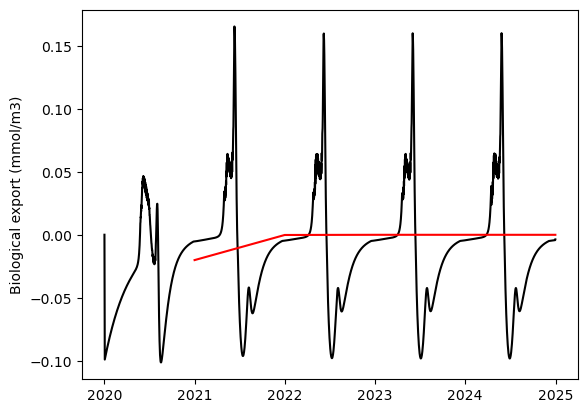

In [7]:
# Plot net export production
export = a2out.y[15,:]
dexport = np.zeros(np.size(export))
for i in range (1,np.size(export)):
    dexport[i]=export[i]-export[i-1]
exportdf = pd.DataFrame([t_a2out,dexport]).T
exportdf.columns = ['Time','Export']
export_year = exportdf.resample('Y', on='Time').mean()
plt.plot(exportdf.Time,exportdf.Export,'k')
plt.plot(export_year.index,export_year.Export,'r')
plt.ylabel('Biological export (mmol/m3)')
#ax3.set_xlabel('Year')
fig.tight_layout()
plt.show()

In [8]:
### Interactive model
%matplotlib inline
def mymodel(Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri):
    # set time range
    trange = [0,365*5]
    # set parameters
    param=np.array([Vmax,K,Kp,Kammo,a,b,g,phy0,lp,lz,ld,KI,Nth,psi,zI,Wsink,c,fPAR,nit,h0,h1,I0,I1,eps_uptakeN,eps_uptakeA,eps_excretion,eps_egestion,eps_reminer,eps_nitri])
    # set initial conditions
    xinit = np.array([nuto,.001,phyo,zooo,deto,1,1,1,1,1,1,1,1,1,1,0])
    # time step size
    h = 1
    # Run model
    a2out = model_run(trange,xinit,param,h,NPZD_A2)
    # Calculat d15N
    delta15 = ((a2out.y[5:10,:]/(a2out.y[5:10,:]+a2out.y[10:15,:]/0.00366))/0.00366-1)*1000
    
    # plot the N15put
    t_a2out = pd.to_datetime(a2out.t, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    N_a2out = a2out.y[0,:]
    A_a2out = a2out.y[1,:]
    P_a2out = a2out.y[2,:]
    Z_a2out = a2out.y[3,:]
    D_a2out = a2out.y[4,:]
    #
    #fig, [ax1,ax2]=plt.subplots(2,figsize=(8, 8),sharex=True)
    fig = plt.figure(figsize=(10, 10))
    gs = GridSpec(nrows=3, ncols=1)
    # Plot NPZDA
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(t_a2out,N_a2out,label='NO3')
    ax1.plot(t_a2out,P_a2out,label='Phyt')
    ax1.plot(t_a2out,Z_a2out,label='Zoop')
    ax1.plot(t_a2out,D_a2out,label='Detr')
    ax1.plot(t_a2out,A_a2out,label='NH4')
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_ylabel('NPZDA (µmol/m3)')
    # Adjust x axis
    xlim1 = pd.to_datetime(365*3, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    xlim2 = pd.to_datetime(365*4, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    ax1.set_xlim(xlim1,xlim2)
    ax1.xaxis.set_major_locator(mdates.MonthLocator())
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    # Plot d15
    ax2 = fig.add_subplot(gs[1, 0],sharex=ax1)
    ax2.plot(t_a2out,delta15[0,:],label='δ15NO3')
    ax2.plot(t_a2out,delta15[2,:],label='δ15Phyt')
    ax2.plot(t_a2out,delta15[3,:],label='δ15Zoop')
    ax2.plot(t_a2out,delta15[4,:],label='δ15Detr')
    ax2.plot(t_a2out,delta15[1,:],label='δ15NH4')
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #ax2.set_xlabel('Month')
    ax2.set_ylabel('δ15 (‰)')
    # Adjust x axis
    xlim1 = pd.to_datetime(365*3, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    xlim2 = pd.to_datetime(365*4, unit = 'D',origin=pd.Timestamp("01-01-2020"))
    ax2.set_xlim(xlim1,xlim2)
    ax2.xaxis.set_major_locator(mdates.MonthLocator())
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    # Plot net export production
    export = a2out.y[15,:]
    dexport = np.zeros(np.size(export))
    for i in range (1,np.size(export)):
        dexport[i]=export[i]-export[i-1]
    exportdf = pd.DataFrame([t_a2out,dexport]).T
    exportdf.columns = ['Time','Export']
    export_month = exportdf.resample('Y', on='Time').mean()
    ax3 = fig.add_subplot(gs[2, 0])
    ax3.plot(exportdf.Time,exportdf.Export,'k')
    ax3.plot(export_month.index,export_month.Export,'r')
    ax3.set_ylabel('Biological export (mmol/m3)')
    #ax3.set_xlabel('Year')
    fig.tight_layout()
    plt.show()
    
widget = interactive(mymodel,
                    Vmax = FloatSlider(min=0, max=5, step =0.1, value=1),
                    K =  FloatSlider(min=0.1, max=5, step =0.1, value=2,description='K_NO3'),
                    Kp = FloatSlider(min=0.1, max=5, step =0.1, value=2.8),
                    Kammo =  FloatSlider(min=0.1, max=1, step =0.1, value=0.2,description='K_NH4'),
                    a =  FloatSlider(min=0, max=1, step =0.01, value=0.66,description='α'),
                    b = FloatSlider(min=0, max=1, step =0.01, value=0.33),description='β',
                    g =  FloatSlider(min=0, max=5, step =0.1, value=1.4),
                    phy0 =  FloatSlider(min=0, max=0.2, step =0.01, value=0.04),
                    lp = FloatSlider(min=0, max=0.2, step =0.01, value=0.05),
                    lz = FloatSlider(min=0, max=0.2, step =0.01, value=0.05),
                    ld=  FloatSlider(min=0, max=0.2, step =0.01, value=0.05),
                    KI = FloatSlider(min=10, max=100, step =10, value=60),
                    Nth =  FloatSlider(min=0, max=100, step =1, value=10),
                    psi =  FloatSlider(min=0, max=5, step =0.05, value=1,description='Ψ'),
                    zI = FloatSlider(min=0, max=100, step =10, value=20),
                    Wsink = FloatSlider(min=0, max=100, step =10, value=20),
                    c =  FloatSlider(min=0, max=0.1, step =0.01, value=0.001),
                    fPAR = FloatSlider(min=0, max=1, step =0.1, value=0.4),
                    nit = FloatSlider(min=0, max=1, step =0.01, value=0.15),
                    h0 = FloatSlider(min=0, max=500, step =10, value=50),
                    h1 = FloatSlider(min=0, max=500, step =10, value=100),
                    I0 = FloatSlider(min=0, max=300, step =10, value=40),
                    I1 = FloatSlider(min=0, max=300, step =10, value=150),
                    eps_uptakeN = FloatSlider(min=-20, max=20, step =1, value= -7.5,description='ϵ_uptkN'), # Phytoplankton NO3 uptake
                    eps_uptakeA = FloatSlider(min=-20, max=20, step =1, value=-10,description='ϵ_uptkA'), # Phytoplankton NH4 uptake
                    eps_egestion = FloatSlider(min=-20, max=20, step =1, value=-1,description='ϵ_egest'), # Zooplankton egestion
                    eps_excretion = FloatSlider(min=-20, max=20, step =1, value=-4,description='ϵ_excre'), # Zooplankton excretion
                    eps_reminer = FloatSlider(min=-20, max=20, step =1, value=-1,description='ϵ_remin'), # Remineralization
                    eps_nitri = FloatSlider(min=-20, max=20, step =1, value=-14,description='ϵ_nitri') # Nitrification
                    );
controls = HBox(widget.children[:-1], layout = Layout(height='350px',flex_flow='column wrap'))
output = widget.children[-1]
display(VBox([controls, output]))